In [1]:
import torch
import cv2
import pickle
import os
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
from tqdm import tqdm

# Foundational Models for Visual Detection

Dataset we will use is the Pascal Visual Object Classes dataset PASCAL VOC
http://host.robots.ox.ac.uk/pascal/VOC/

Image formatting and initial code derived from:
https://tarunbisht.com/deep%20learning/2024/03/24/pytorch-rcnn-tutorial-object-detection/



In [2]:
# loading detection data
voc_dataset_train = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="train",
                                                download=True,
                                                year="2007")
voc_dataset_val = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="val",
                                                download=True,
                                                year="2007")

'''
voc_dataset_test = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="test",
                                                download=True,
                                                year="2007")
'''


Using downloaded and verified file: content/voc\VOCtrainval_06-Nov-2007.tar
Extracting content/voc\VOCtrainval_06-Nov-2007.tar to content/voc
Using downloaded and verified file: content/voc\VOCtrainval_06-Nov-2007.tar
Extracting content/voc\VOCtrainval_06-Nov-2007.tar to content/voc


'\nvoc_dataset_test = torchvision.datasets.VOCDetection(root="content/voc",\n                                                image_set="test",\n                                                download=True,\n                                                year="2007")\n'

In [3]:
voc_dataset_train[0]

(<PIL.Image.Image image mode=RGB size=500x333>,
 {'annotation': {'folder': 'VOC2007',
   'filename': '000012.jpg',
   'source': {'database': 'The VOC2007 Database',
    'annotation': 'PASCAL VOC2007',
    'image': 'flickr',
    'flickrid': '207539885'},
   'owner': {'flickrid': 'KevBow', 'name': '?'},
   'size': {'width': '500', 'height': '333', 'depth': '3'},
   'segmented': '0',
   'object': [{'name': 'car',
     'pose': 'Rear',
     'truncated': '0',
     'difficult': '0',
     'bndbox': {'xmin': '156', 'ymin': '97', 'xmax': '351', 'ymax': '270'}}]}})

In [4]:
print("Sample Image shape: ", np.array(voc_dataset_train[0][0]).shape)

Sample Image shape:  (333, 500, 3)


In [5]:
print("Sample Image shape: ", np.array(voc_dataset_train[1][0]).shape)

Sample Image shape:  (364, 480, 3)


Images are different sizes 

Next to determine all the object classes for detection

Then create dictionaries 

In [6]:
all_objs = []
for ds in voc_dataset_train:
    obj_annots = ds[1]["annotation"]["object"]
    for obj in obj_annots:
        all_objs.append(obj["name"])

unique_class_labels = set(all_objs)
print("Number of unique objects in dataset: ", len(unique_class_labels))
print("Unique labels in dataset: \n", unique_class_labels)

Number of unique objects in dataset:  20
Unique labels in dataset: 
 {'bird', 'sheep', 'cow', 'chair', 'aeroplane', 'train', 'car', 'person', 'boat', 'bottle', 'motorbike', 'bus', 'cat', 'dog', 'diningtable', 'horse', 'bicycle', 'pottedplant', 'tvmonitor', 'sofa'}


In [8]:
label_2_idx = {'pottedplant': 1, 'person': 2,
               'motorbike': 3, 'train': 4,
               'dog': 5, 'diningtable': 6,
               'horse': 7, 'bus': 8,
               'aeroplane': 9, 'sofa': 10,
               'sheep': 11, 'tvmonitor': 12,
               'bird': 13, 'bottle': 14,
               'chair': 15, 'cat': 16,
               'bicycle': 17, 'cow': 18,
               'boat': 19, 'car': 20, 'bg': 0}
idx_2_label = {1: 'pottedplant', 2: 'person',
               3: 'motorbike', 4: 'train',
               5: 'dog', 6: 'diningtable',
               7: 'horse', 8: 'bus',
               9: 'aeroplane', 10: 'sofa',
               11: 'sheep', 12: 'tvmonitor',
               13: 'bird', 14: 'bottle',
               15: 'chair', 16: 'cat',
               17: 'bicycle', 18: 'cow',
               19: 'boat', 20: 'car', 0: 'bg'}

Dataset bounding box visualization

In [9]:
# img: image as np array
# boxes: [[xmin, y_min, x_max, y_max]]
# labels: labels present in bounding boxes
# scores: array of probabilities that given object is present in bounding boxes.
# class_map: dictionary that maps index to class names
def draw_boxes(img, boxes, scores, labels, class_map=None):
    nums = len(boxes)
    for i in range(nums):
        x1y1 = tuple((np.array(boxes[i][0:2])).astype(np.int32))
        x2y2 = tuple((np.array(boxes[i][2:4])).astype(np.int32))
        img = cv2.rectangle(img, x1y1, x2y2, (255, 0, 0), 2)
        label = int(labels[i])
        if class_map is not None:
            label_txt = class_map[label]
        else:
            label_txt = str(label)
        img = cv2.putText(
            img,
            "{} {:.4f}".format(label_txt, scores[i]),
            x1y1,
            cv2.FONT_HERSHEY_COMPLEX_SMALL,
            1,
            (0, 0, 255),
            2,
        )
    return img

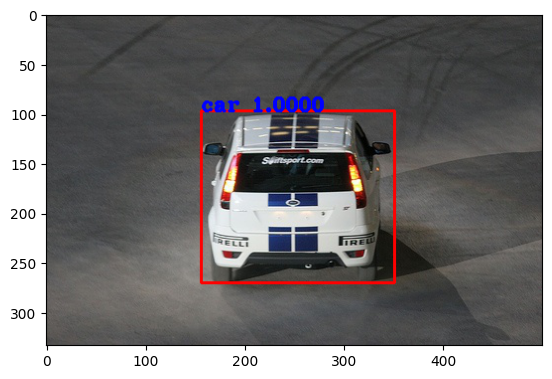

In [10]:
sample_image, sample_annot = voc_dataset_train[0]
sample_image = np.array(sample_image)
sample_annot = sample_annot["annotation"]["object"]
boxes = [[int(v) for k, v in x["bndbox"].items()] for x in sample_annot]
labels = [label_2_idx[x["name"]] for x in sample_annot]
scores = [1]*len(labels)
final_image = draw_boxes(sample_image, boxes, scores, labels, idx_2_label)
plt.imshow(final_image)
plt.show()

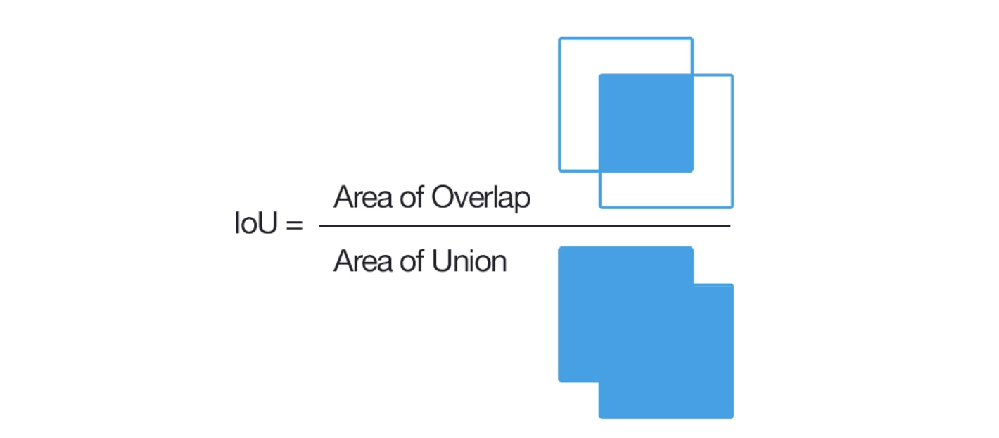

Need to calculate the intersection over union score between boxes.

In [11]:
def calculate_iou_score(box_1, box_2):
    '''
        box_1 = single of ground truth bounding boxes
        box_2 = single of predicted bounded boxes
    '''
    box_1_x1 = box_1[0]
    box_1_y1 = box_1[1]
    box_1_x2 = box_1[2]
    box_1_y2 = box_1[3]

    box_2_x1 = box_2[0]
    box_2_y1 = box_2[1]
    box_2_x2 = box_2[2]
    box_2_y2 = box_2[3]

    x1 = np.maximum(box_1_x1, box_2_x1)
    y1 = np.maximum(box_1_y1, box_2_y1)
    x2 = np.minimum(box_1_x2, box_2_x2)
    y2 = np.minimum(box_1_y2, box_2_y2)

    area_of_intersection = max(0, x2 - x1 + 1) * max(0, y2 - y1 + 1)
    area_box_1 = (box_1_x2 - box_1_x1 + 1) * (box_1_y2 - box_1_y1 + 1)
    area_box_2 = (box_2_x2 - box_2_x1 + 1) * (box_2_y2 - box_2_y1 + 1)
    area_of_union = area_box_1 + area_box_2 - area_of_intersection

    return area_of_intersection/float(area_of_union)

Images need to be adjusted and formatted to RCNN, see tutorial for in depth explaination

https://tarunbisht.com/deep%20learning/2024/03/24/pytorch-rcnn-tutorial-object-detection/

In [12]:
def process_data_for_rcnn(image, rects, class_map, boxes_annots, iou_threshold, max_boxes):
    true_classes = []
    image_sections = []
    true_count = 0
    false_count = 0
    for annot in boxes_annots:
        label = annot["name"]
        box = [int(c) for _, c in annot["bndbox"].items()]
        box = np.array(box)
        for rect in rects:
            iou_score = calculate_iou_score(rect, box)
            if iou_score > iou_threshold:
                if true_count < max_boxes//2:
                    true_classes.append(class_map[label])
                    x1, y1, x2, y2 = rect
                    img_section = image[y1: y2, x1: x2]
                    image_sections.append(img_section)
                    true_count += 1
            else:
                if false_count < max_boxes//2:
                    true_classes.append(0)
                    x1, y1, x2, y2 = rect
                    img_section = image[y1: y2, x1: x2]
                    image_sections.append(img_section)
                    false_count += 1
    return image_sections, true_classes

In [13]:
max_iou_threshold = 0.7
max_boxes = 50
max_selections = 1000
processed_data_save_path_train = "model/rcnn-processed-pickle/rcnn_train/rcnn_train"
processed_data_save_path_val = "model/rcnn-processed-pickle/rcnn_val/rcnn_val"
os.makedirs(processed_data_save_path_train, exist_ok=True)
os.makedirs(processed_data_save_path_val, exist_ok=True)

Preparing all images for dataset (Only needs to be done once)

In [ ]:
all_images = []
all_labels = []
count = 0
if len(os.listdir(processed_data_save_path_train)) < 80000:
    for image, annot in tqdm(voc_dataset_train):
        image = np.array(image)
        boxes_annots = annot["annotation"]["object"]
        ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
        ss.setBaseImage(image)
        ss.switchToSelectiveSearchFast()
        rects = ss.process()[:max_selections]
        rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
        images, classes = process_data_for_rcnn(image,
                                                rects,
                                                label_2_idx,
                                                boxes_annots,
                                                max_iou_threshold,
                                                max_boxes)
        count += 1
        all_images += images
        all_labels += classes

    # saving processed data to pickle file
    for idx, (image, label) in enumerate(zip(all_images, all_labels)):
        with open(os.path.join(processed_data_save_path_train, f"img_{idx}.pkl"), "wb") as pkl:
            pickle.dump({"image": image, "label": label}, pkl)
else:
    print("Data Already Prepared.")

In [ ]:
all_images = []
all_labels = []
count = 0
if len(os.listdir(processed_data_save_path_val)) < 80000:
    for image, annot in tqdm(voc_dataset_val):
        image = np.array(image)
        boxes_annots = annot["annotation"]["object"]
        ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
        ss.setBaseImage(image)
        ss.switchToSelectiveSearchFast()
        rects = ss.process()[:max_selections]
        rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
        images, classes = process_data_for_rcnn(image,
                                                rects,
                                                label_2_idx,
                                                boxes_annots,
                                                max_iou_threshold,
                                                max_boxes)
        count += 1
        all_images += images
        all_labels += classes

    # saving processed data to pickle file
    for idx, (image, label) in enumerate(zip(all_images, all_labels)):
        with open(os.path.join(processed_data_save_path_val, f"img_{idx}.pkl"), "wb") as pkl:
            pickle.dump({"image": image, "label": label}, pkl)
else:
    print("Data Already Prepared.")

Creating the PyTorch dataset

In [14]:
class RCNNDataset(torch.utils.data.Dataset):
    def __init__(self, processed_data_folder, section_dim=(224, 224)):
        self.section_dim = section_dim
        self.data_files = os.listdir(processed_data_folder)
        self.data_files = list(map(lambda x: os.path.join(processed_data_folder, x), self.data_files))
        self.preprocess = torchvision.transforms.Normalize([0.485, 0.456, 0.406],
                                                           [0.229, 0.224, 0.225])

    def __len__(self):
        return len(self.data_files)

    def __getitem__(self, idx):
        with open(self.data_files[idx], "rb") as pkl:
            data = pickle.load(pkl)
        image, label = data["image"], data["label"]
        image = cv2.resize(image, self.section_dim)
        image = np.asarray(image, dtype=np.float32)
        image = torch.from_numpy(image)
        image = torch.permute(image, (2, 0, 1))
        image = self.preprocess(image)
        label = torch.tensor(label)
        return image, label

To visualize batches of data we have defined imshow function that takes batch of images and labels as inputs and plot them in a grid.

From:
https://pytorch.org/vision/0.9/models.html
Some models use modules which have different training and evaluation behavior, such as batch normalization. To switch between these modes, use model.train() or model.eval() as appropriate. See train() or eval() for details.

All pre-trained models expect input images normalized in the same way, i.e. mini-batches of 3-channel RGB images of shape (3 x H x W), where H and W are expected to be at least 224. The images have to be loaded in to a range of [0, 1] and then normalized using mean = [0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225]. You can use the following transform to normalize:

In [15]:
def imshow(inp, labels, num_rows=16, num_cols=4):
    """Display image for Tensor."""
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 30))
    axes = axes.ravel()
    mean = torch.tensor([0.485, 0.456, 0.406]).reshape(1, -1, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).reshape(1, -1, 1, 1)
    inp = std * inp + mean
    inp = inp.permute((0, 2, 3, 1))
    inp = inp.type(torch.uint8)
    for idx, ax in enumerate(axes):
        ax.imshow(inp[idx])
        ax.set_title(labels[idx])
        ax.grid(False)
        ax.set_axis_off()
    plt.show()

In [16]:
train_dataset = RCNNDataset(processed_data_folder=processed_data_save_path_train, section_dim=(224, 224))
val_dataset = RCNNDataset(processed_data_folder=processed_data_save_path_val, section_dim=(224, 224))

In [17]:
print("Train Dataset one sample images shape: ", train_dataset[0][0].shape)
print("Train Dataset one sample labels shape: ", train_dataset[0][1].shape)
print("Train Dataset one sample images dtype: ", train_dataset[0][0].dtype)
print("Train Dataset one sample labels dtype: ", train_dataset[0][1].dtype)
print("Train Dataset number of samples: ", len(train_dataset))

Train Dataset one sample images shape:  torch.Size([3, 224, 224])
Train Dataset one sample labels shape:  torch.Size([])
Train Dataset one sample images dtype:  torch.float32
Train Dataset one sample labels dtype:  torch.int64
Train Dataset number of samples:  79528


In [18]:
print("Val Dataset one sample images shape: ", val_dataset[0][0].shape)
print("Val Dataset one sample labels shape: ", val_dataset[0][1].shape)
print("Val Dataset one sample images dtype: ", val_dataset[0][0].dtype)
print("Val Dataset one sample labels dtype: ", val_dataset[0][1].dtype)
print("Val Dataset number of samples: ", len(val_dataset))

Val Dataset one sample images shape:  torch.Size([3, 224, 224])
Val Dataset one sample labels shape:  torch.Size([])
Val Dataset one sample images dtype:  torch.float32
Val Dataset one sample labels dtype:  torch.int64
Val Dataset number of samples:  79671


Now that we set up the processed dataset we use the torch utils for the dataloader with a batch size of 32 to train and 64 for validation

In [19]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=False)

Train Batch


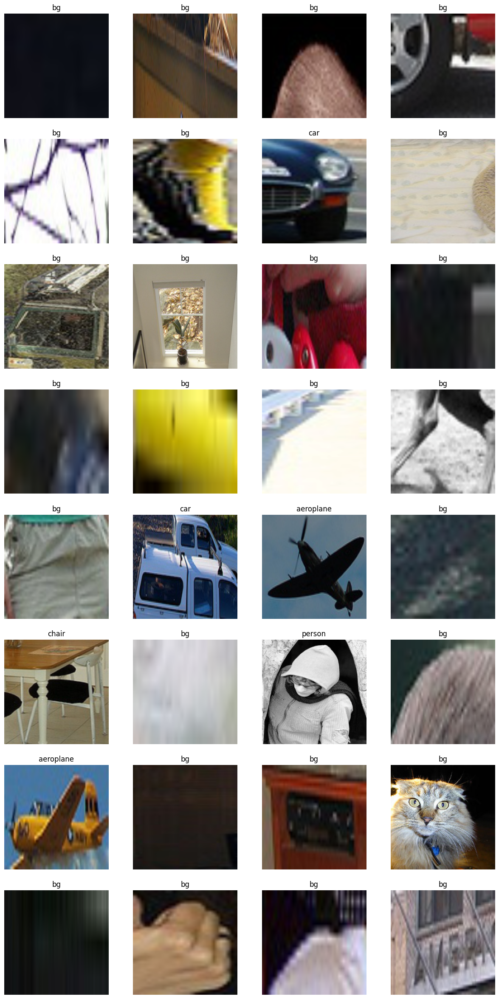

In [20]:
inputs, labels = next(iter(train_loader))
labels = [idx_2_label[x.item()] for x in labels]
print("Train Batch")
imshow(inputs, labels, num_rows=8, num_cols=4)

### time to build the model

Setting up the device and the model

using dropout layers and 2 fully connected layers with a sigmoid activation

In [21]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using Device: ", device)

Using Device:  cuda


Pytorch has multiple pretrained foundation models: https://pytorch.org/vision/0.18/models.html

Building the custom final layers replaces the previous output layers with custom layers.

To do this a familiarization with the model source code is needed https://github.com/pytorch/vision/blob/main/torchvision/models/resnet.py

As seen from the source code the final layer is a linear fully connected layer named fc in the code.  

we then change this layer with our custom layers.

In [22]:
def build_model(backbone, num_classes):
    num_ftrs = backbone.fc.in_features
    # num_classes = number of class categories and +1 for background class
    backbone.fc = nn.Sequential(nn.Dropout(0.2),
                                nn.Linear(num_ftrs, 512),
                                nn.Dropout(0.2),
                                nn.Linear(512, num_classes+1))
                                #nn.Sigmoid())
    return backbone

Using the resnet50 backbone trained on imagenet dataset

Freezing the resnet parameters to speed training.

Then building the final model to accomodate the custom output we are providing.


In [23]:
resnet_backbone = torchvision.models.resnet50(weights='IMAGENET1K_V2')
# freeze pretrained backbone
for param in resnet_backbone.parameters():
    param.requires_grad = False
model = build_model(backbone=resnet_backbone, num_classes=len(unique_class_labels))
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Assigning the classification weights 

Choosing the BCE Loss function

with the Adam optimizer

In [24]:
class_weights = [1.0]+[2.0]*len(unique_class_labels) # 1 for bg and 2 for other classes
class_weights = torch.tensor(class_weights).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=1e-4)

Now to train:

In [ ]:
torch.cuda.empty_cache()
num_epochs = 5
best_val_loss = 1000
epoch_train_losses = []
epoch_val_losses = []
train_accuracy = []
val_accuracy = []
count = 0
for idx in range(num_epochs):
    train_losses = []
    total_train = 0
    correct_train = 0
    model.train()
    for images, labels in tqdm(train_loader):
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        pred = model(images)
        loss = criterion(pred, labels)
        predicted = torch.argmax(pred, 1)
        total_train += labels.shape[0]
        correct_train += (predicted == labels).sum().item()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())
    accuracy_train = (100 * correct_train) / total_train
    train_accuracy.append(accuracy_train)
    epoch_train_loss = np.mean(train_losses)
    epoch_train_losses.append(epoch_train_loss)

    val_losses = []
    total_val = 0
    correct_val = 0
    model.eval()
    with torch.no_grad():
        for images, labels in tqdm(val_loader):
            images = images.to(device)
            labels = labels.to(device)
            pred = model(images)
            loss = criterion(pred, labels)
            val_losses.append(loss.item())
            predicted = torch.argmax(pred, 1)
            total_val += labels.shape[0]
            correct_val += (predicted == labels).sum().item()

    accuracy_val = (100 * correct_val) / total_val
    val_accuracy.append(accuracy_val)
    epoch_val_loss = np.mean(val_losses)
    epoch_val_losses.append(epoch_val_loss)

    print('\nEpoch: {}/{}, Train Loss: {:.8f}, Train Accuracy: {:.8f}, Val Loss: {:.8f}, Val Accuracy: {:.8f}'.format(idx + 1, num_epochs, epoch_train_loss, accuracy_train, epoch_val_loss, accuracy_val))


    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        print("Saving the model state dictionary for Epoch: {} with Validation loss: {:.8f}".format(idx + 1, epoch_val_loss))
        torch.save(model.state_dict(), "model/rcnn_model.pt")
        count = 0
    else:
        count += 1

    if count == 5:
        break

100%|██████████| 1245/1245 [06:14<00:00,  3.33it/s]



Epoch: 1/5, Train Loss: 0.64596323, Train Accuracy: 87.16426919, Val Loss: 0.50804128, Val Accuracy: 88.86545920
Saving the model state dictionary for Epoch: 1 with Validation loss: 0.50804128


100%|██████████| 1245/1245 [02:03<00:00, 10.09it/s]



Epoch: 2/5, Train Loss: 0.41850504, Train Accuracy: 89.84508601, Val Loss: 0.54479371, Val Accuracy: 88.62823361


100%|██████████| 1245/1245 [02:04<00:00, 10.01it/s]



Epoch: 3/5, Train Loss: 0.36848617, Train Accuracy: 90.71899205, Val Loss: 0.48306368, Val Accuracy: 89.20309774
Saving the model state dictionary for Epoch: 3 with Validation loss: 0.48306368


100%|██████████| 1245/1245 [02:03<00:00, 10.07it/s]



Epoch: 4/5, Train Loss: 0.34316159, Train Accuracy: 91.18297958, Val Loss: 0.45379917, Val Accuracy: 89.65621117
Saving the model state dictionary for Epoch: 4 with Validation loss: 0.45379917


100%|██████████| 1245/1245 [02:04<00:00, 10.00it/s]


Epoch: 5/5, Train Loss: 0.32366827, Train Accuracy: 91.59792777, Val Loss: 0.49778964, Val Accuracy: 89.27715229


Loading the trained model if needed

In [30]:
if not os.path.exists('model'):
    os.makedirs('model')
    
torch.save(model.state_dict(), "model/rcnn_model.pt")
print("Model saved!")

Model saved!


helper functions that process image output and return box proposals, and create single bounding boxes from overlapping boxes

In [26]:
normalized_transform = torchvision.transforms.Normalize([0.485, 0.456, 0.406],
                                                        [0.229, 0.224, 0.225])
def process_inputs(image, max_selections=300, section_size=(224, 224)):
    images = []
    boxes = []
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    ss.switchToSelectiveSearchQuality()
    rects = ss.process()[:max_selections]
    rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
    for rect in rects:
        x1, y1, x2, y2 = rect
        img_section = image[y1: y2, x1: x2]
        img_section = cv2.resize(img_section, section_size)
        images.append(img_section)
        boxes.append(rect)
    images = np.array(images, dtype=np.float32)
    images = torch.from_numpy(images)
    images = images.permute(0, 3, 1, 2)
    images = normalized_transform(images)
    return images, np.array(boxes)

In [27]:
def non_max_supression(boxes, scores, labels, threshold=0.5, iou_threshold=0.5):
    idxs = np.where(scores>threshold)
    boxes = boxes[idxs]
    scores = scores[idxs]
    labels = labels[idxs]
    idxs = np.argsort(scores)
    chossen_boxes = []
    choosen_boxes_scores = []
    choosen_boxes_labels = []
    while len(idxs):
        last = len(idxs) - 1
        choosen_idx = idxs[last]
        choosen_box = boxes[choosen_idx]
        choosen_box_score = scores[choosen_idx]
        choosen_box_label = labels[choosen_idx]
        chossen_boxes.append(choosen_box)
        choosen_boxes_scores.append(choosen_box_score)
        choosen_boxes_labels.append(choosen_box_label)
        idxs = np.delete(idxs, last)
        i = len(idxs)-1
        while i >= 0:
            idx = idxs[i]
            curr_box = boxes[idx]
            curr_box_score = scores[idx]
            curr_box_label = labels[idx]
            if (curr_box_label == choosen_box_label and
                calculate_iou_score(curr_box, choosen_box) > iou_threshold):
                idxs = np.delete(idxs, i)
            i -= 1
    return chossen_boxes, choosen_boxes_scores, choosen_boxes_labels

In [28]:
def process_outputs(scores, boxes, threshold=0.5, iou_threshold=0.5):
    labels = np.argmax(scores, axis=1)
    probas = np.max(scores, axis=1)
    idxs = labels != 0
    boxes = boxes[idxs]
    probas = probas[idxs]
    labels = labels[idxs]
    assert len(probas) == len(boxes) == len(labels)
    final_boxes, final_boxes_scores, final_boxes_labels = non_max_supression(boxes, probas, labels, threshold, iou_threshold)
    return final_boxes, final_boxes_scores, final_boxes_labels

Now load the model, and set to evaluation mode. this eliminates batch normalization and disables dropout layer

Then run the helper functions to process the outputs.

input the preped images to the model, for the output.  Take the output to determine the scores then process the final bounding boxes (eliminate mostly overlapping bounding boxes)

In [29]:
val_image = np.array(voc_dataset_val[0][0])
# preprocess input image
prep_val_images, prep_val_boxes = process_inputs(val_image)
prep_val_images.shape, prep_val_images.dtype, prep_val_boxes.shape, prep_val_boxes.dtype

(torch.Size([300, 3, 224, 224]), torch.float32, (300, 4), dtype('int32'))

In [31]:
# Load the saved state dictionary
model.load_state_dict(torch.load("model/rcnn_model.pt"))
model.eval()  # Set to evaluation mode

C:\Users\jmber\AppData\Local\Temp\ipykernel_9992\177949583.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("model/rcnn_model.pt"))


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [32]:
with torch.no_grad():
    output = model(prep_val_images.to(device))
# postprocess output from model
scores = torch.softmax(output, dim=1).cpu().numpy()
boxes, boxes_scores, boxes_labels = process_outputs(scores, prep_val_boxes, threshold=0.5, iou_threshold=0.5)

previous code predics based on the first val image, then subsequent code plots the image with the formatted predictors 

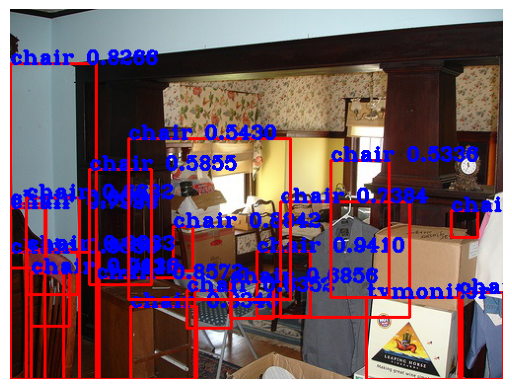

In [33]:
final_image = draw_boxes(val_image,
                         boxes,
                         boxes_scores,
                         boxes_labels,
                         idx_2_label)
plt.axis("off")
plt.imshow(final_image)
plt.show()

now for processing multiple images

In [34]:
def predict(image, only_boxed_image=False, label_map=None, max_boxes=100, threshold=0.5, iou_threshold=0.5):
    # preprocess input image
    prep_val_images, prep_val_boxes = process_inputs(image, max_selections=max_boxes)
    model.eval()
    with torch.no_grad():
        output = model(prep_val_images.to(device))
    # postprocess output from model
    scores = torch.softmax(output, dim=1).cpu().numpy()
    boxes, boxes_scores, boxes_labels = process_outputs(scores,
                                                        prep_val_boxes,
                                                        threshold=threshold,
                                                        iou_threshold=iou_threshold)
    if only_boxed_image:
        box_image = draw_boxes(image, boxes, boxes_scores, boxes_labels, label_map)
        return box_image
    return boxes, boxes_scores, boxes_labels

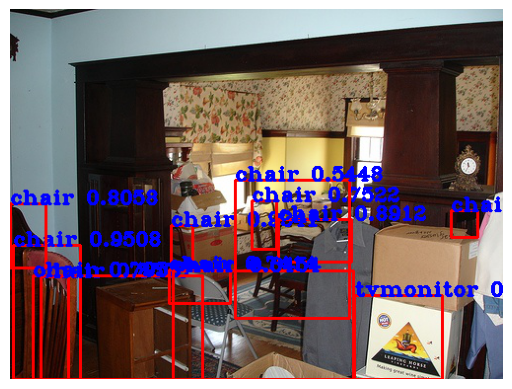

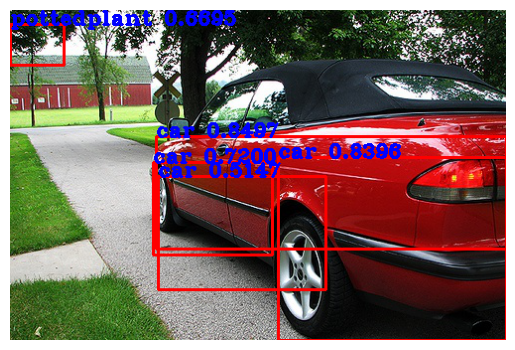

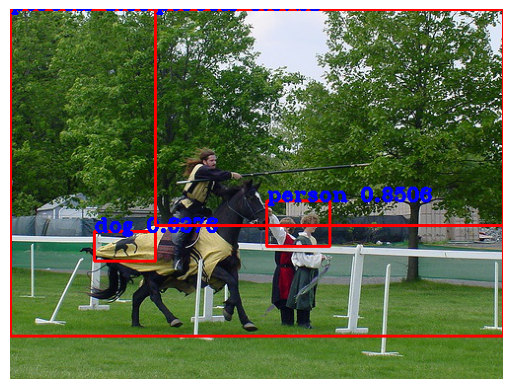

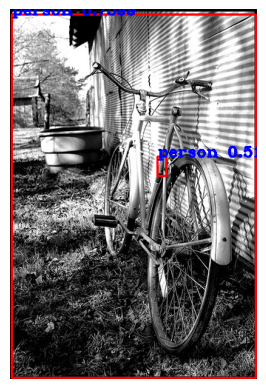

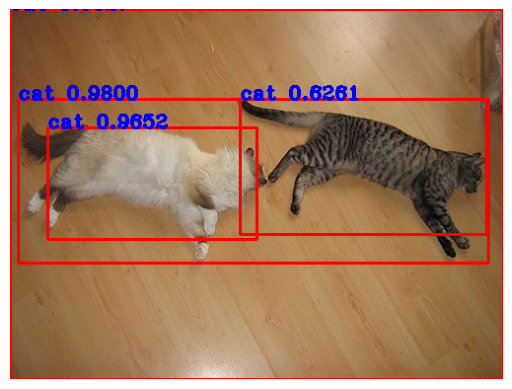

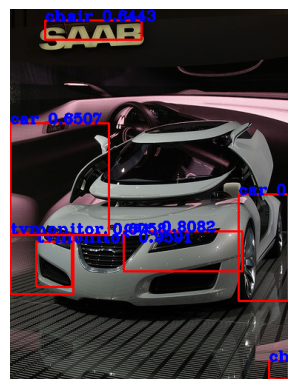

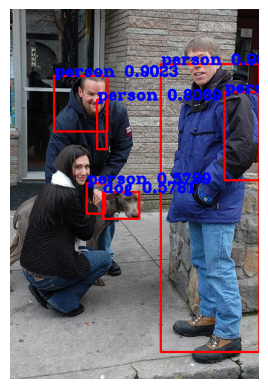

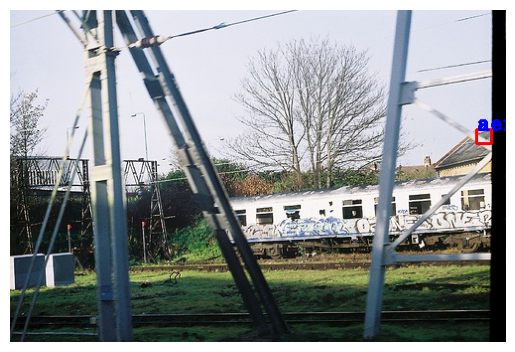

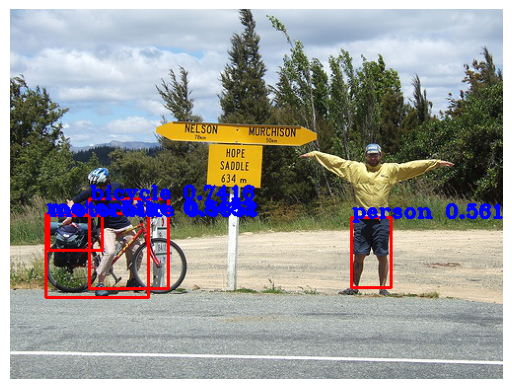

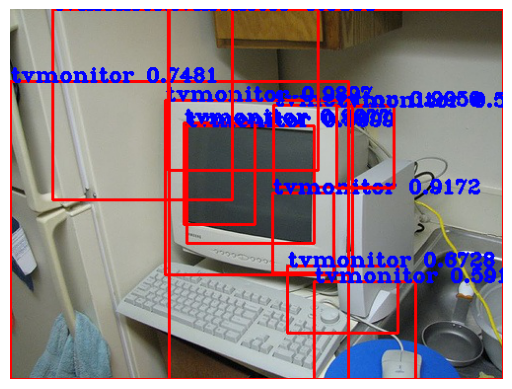

In [35]:
for i in range(10):
    image = np.array(voc_dataset_val[i][0])
    final_image = predict(image, only_boxed_image=True,
                          label_map=idx_2_label,
                          threshold=0.5, iou_threshold=0.5)
    plt.axis("off")
    plt.imshow(final_image)
    plt.show()

In [36]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=False)

EfficientNetV2 https://arxiv.org/abs/1905.11946 is another model from https://pytorch.org/vision/0.18/models.html

this model uses a different labeling structure than resnet. again a familiarization is needed with the source code to adapt the final layers https://github.com/pytorch/vision/blob/main/torchvision/models/efficientnet.py



In [40]:
def build_modele(backbone, num_classes):
    num_ftrs = backbone.classifier[1].in_features
    # num_classes = number of class categories and +1 for background class
    backbone.classifier = nn.Sequential(nn.Dropout(0.2),
                                nn.Linear(num_ftrs, 512),
                                nn.Dropout(0.2),
                                nn.Linear(512, num_classes+1))
                                # nn.Sigmoid())
    return backbone

In [41]:
efficient_backbone = torchvision.models.efficientnet_v2_s(weights='EfficientNet_V2_S_Weights.IMAGENET1K_V1')
# freeze pretrained backbone
for param in efficient_backbone.parameters():
    param.requires_grad = False
modele = build_modele(backbone=efficient_backbone, num_classes=len(unique_class_labels))
modele.to(device)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [42]:
class_weights = [1.0]+[2.0]*len(unique_class_labels) # 1 for bg and 2 for other classes
class_weights = torch.tensor(class_weights).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(modele.parameters(), lr=1e-4)

In [43]:
torch.cuda.empty_cache()
num_epochs = 5
best_val_loss = 1000
epoch_train_losses = []
epoch_val_losses = []
train_accuracy = []
val_accuracy = []
count = 0
for idx in range(num_epochs):
    train_losses = []
    total_train = 0
    correct_train = 0
    modele.train()
    for images, labels in tqdm(train_loader):
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        pred = modele(images)
        loss = criterion(pred, labels)
        predicted = torch.argmax(pred, 1)
        total_train += labels.shape[0]
        correct_train += (predicted == labels).sum().item()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())
    accuracy_train = (100 * correct_train) / total_train
    train_accuracy.append(accuracy_train)
    epoch_train_loss = np.mean(train_losses)
    epoch_train_losses.append(epoch_train_loss)

    val_losses = []
    total_val = 0
    correct_val = 0
    modele.eval()
    with torch.no_grad():
        for images, labels in tqdm(val_loader):
            images = images.to(device)
            labels = labels.to(device)
            pred = modele(images)
            loss = criterion(pred, labels)
            val_losses.append(loss.item())
            predicted = torch.argmax(pred, 1)
            total_val += labels.shape[0]
            correct_val += (predicted == labels).sum().item()

    accuracy_val = (100 * correct_val) / total_val
    val_accuracy.append(accuracy_val)
    epoch_val_loss = np.mean(val_losses)
    epoch_val_losses.append(epoch_val_loss)

    print('\nEpoch: {}/{}, Train Loss: {:.8f}, Train Accuracy: {:.8f}, Val Loss: {:.8f}, Val Accuracy: {:.8f}'.format(idx + 1, num_epochs, epoch_train_loss, accuracy_train, epoch_val_loss, accuracy_val))


    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        print("Saving the model state dictionary for Epoch: {} with Validation loss: {:.8f}".format(idx + 1, epoch_val_loss))
        torch.save(modele.state_dict(), "model/efficientNet_model.pt")
        count = 0
    else:
        count += 1

    if count == 5:
        break

100%|██████████| 1245/1245 [01:54<00:00, 10.87it/s]



Epoch: 1/5, Train Loss: 0.83469873, Train Accuracy: 83.60451665, Val Loss: 3.55048789, Val Accuracy: 85.94846305
Saving the model state dictionary for Epoch: 1 with Validation loss: 3.55048789


100%|██████████| 1245/1245 [01:59<00:00, 10.44it/s]



Epoch: 2/5, Train Loss: 0.55155226, Train Accuracy: 86.52172820, Val Loss: 2.78900560, Val Accuracy: 86.39153519
Saving the model state dictionary for Epoch: 2 with Validation loss: 2.78900560


100%|██████████| 1245/1245 [01:56<00:00, 10.72it/s]



Epoch: 3/5, Train Loss: 0.51165544, Train Accuracy: 87.23342722, Val Loss: 0.77500831, Val Accuracy: 87.02162644
Saving the model state dictionary for Epoch: 3 with Validation loss: 0.77500831


100%|██████████| 1245/1245 [01:57<00:00, 10.59it/s]



Epoch: 4/5, Train Loss: 0.49277621, Train Accuracy: 87.45976260, Val Loss: 6.09779480, Val Accuracy: 87.26010719


100%|██████████| 1245/1245 [01:57<00:00, 10.63it/s]


Epoch: 5/5, Train Loss: 0.47838742, Train Accuracy: 87.70747410, Val Loss: 2.00707992, Val Accuracy: 87.31031366


In [44]:
torch.save(modele.state_dict(), "model/efficientNet_model.pt")
print("Model saved!")

modele.eval() 

Model saved!


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [45]:
normalized_transform = torchvision.transforms.Normalize([0.485, 0.456, 0.406],
                                                        [0.229, 0.224, 0.225])
def process_inputs(image, max_selections=300, section_size=(224, 224)):
    images = []
    boxes = []
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    ss.switchToSelectiveSearchQuality()
    rects = ss.process()[:max_selections]
    rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
    for rect in rects:
        x1, y1, x2, y2 = rect
        img_section = image[y1: y2, x1: x2]
        img_section = cv2.resize(img_section, section_size)
        images.append(img_section)
        boxes.append(rect)
    images = np.array(images, dtype=np.float32)
    images = torch.from_numpy(images)
    images = images.permute(0, 3, 1, 2)
    images = normalized_transform(images)
    return images, np.array(boxes)

In [46]:
def non_max_supression(boxes, scores, labels, threshold=0.5, iou_threshold=0.5):
    idxs = np.where(scores>threshold)
    boxes = boxes[idxs]
    scores = scores[idxs]
    labels = labels[idxs]
    idxs = np.argsort(scores)
    chossen_boxes = []
    choosen_boxes_scores = []
    choosen_boxes_labels = []
    while len(idxs):
        last = len(idxs) - 1
        choosen_idx = idxs[last]
        choosen_box = boxes[choosen_idx]
        choosen_box_score = scores[choosen_idx]
        choosen_box_label = labels[choosen_idx]
        chossen_boxes.append(choosen_box)
        choosen_boxes_scores.append(choosen_box_score)
        choosen_boxes_labels.append(choosen_box_label)
        idxs = np.delete(idxs, last)
        i = len(idxs)-1
        while i >= 0:
            idx = idxs[i]
            curr_box = boxes[idx]
            curr_box_score = scores[idx]
            curr_box_label = labels[idx]
            if (curr_box_label == choosen_box_label and
                calculate_iou_score(curr_box, choosen_box) > iou_threshold):
                idxs = np.delete(idxs, i)
            i -= 1
    return chossen_boxes, choosen_boxes_scores, choosen_boxes_labels

In [47]:
def process_outputs(scores, boxes, threshold=0.5, iou_threshold=0.5):
    labels = np.argmax(scores, axis=1)
    probas = np.max(scores, axis=1)
    idxs = labels != 0
    boxes = boxes[idxs]
    probas = probas[idxs]
    labels = labels[idxs]
    assert len(probas) == len(boxes) == len(labels)
    final_boxes, final_boxes_scores, final_boxes_labels = non_max_supression(boxes, probas, labels, threshold, iou_threshold)
    return final_boxes, final_boxes_scores, final_boxes_labels

Now to predict with the efficientNet

In [ ]:
modele.load_state_dict(torch.load("model/efficientNet_model.pt"))

In [48]:
val_image = np.array(voc_dataset_val[0][0])
# preprocess input image
prep_val_images, prep_val_boxes = process_inputs(val_image)
prep_val_images.shape, prep_val_images.dtype, prep_val_boxes.shape, prep_val_boxes.dtype

(torch.Size([300, 3, 224, 224]), torch.float32, (300, 4), dtype('int32'))

In [49]:
modele.eval()
with torch.no_grad():
    outpute = modele(prep_val_images.to(device))
# postprocess output from model
scorese = torch.softmax(outpute, dim=1).cpu().numpy()
boxese, boxes_scorese, boxes_labelse = process_outputs(scorese, prep_val_boxes, threshold=0.5, iou_threshold=0.5)

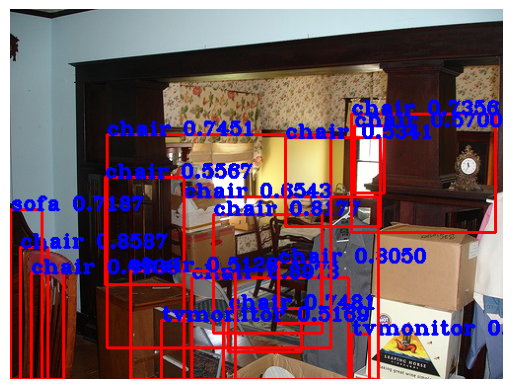

In [50]:
final_imagee = draw_boxes(val_image,
                         boxese,
                         boxes_scorese,
                         boxes_labelse,
                         idx_2_label)
plt.axis("off")
plt.imshow(final_imagee)
plt.show()

In [53]:
def predicte(image, only_boxed_image=False, label_map=None, max_boxes=100, threshold=0.5, iou_threshold=0.5):
    # preprocess input image
    prep_val_images, prep_val_boxes = process_inputs(image, max_selections=max_boxes)
    modele.eval()
    with torch.no_grad():
        outpute = modele(prep_val_images.to(device))
    # postprocess output from model
    scorese = torch.softmax(outpute, dim=1).cpu().numpy()
    boxese, boxes_scorese, boxes_labelse = process_outputs(scorese,
                                                        prep_val_boxes,
                                                        threshold=threshold,
                                                        iou_threshold=iou_threshold)
    if only_boxed_image:
        box_imagee = draw_boxes(image, boxese, boxes_scorese, boxes_labelse, label_map)
        return box_imagee
    return boxese, boxes_scorese, boxes_labelse

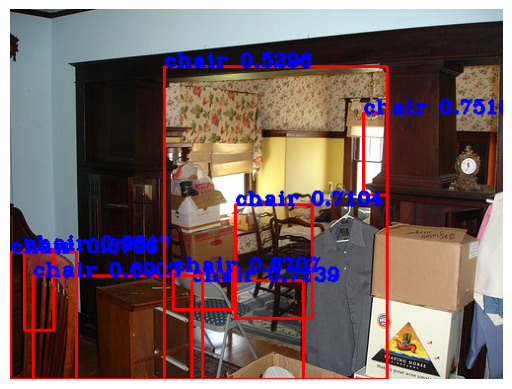

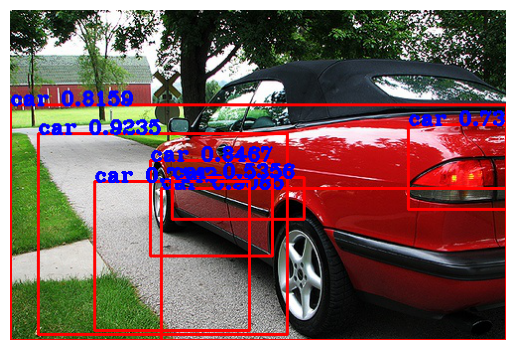

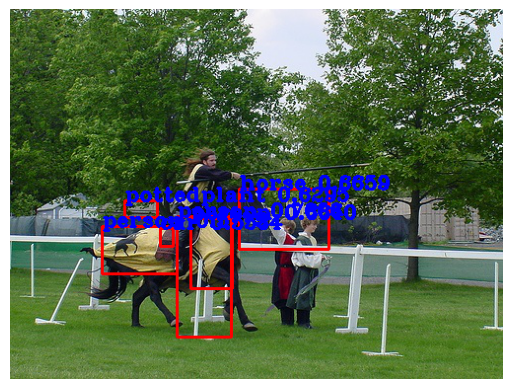

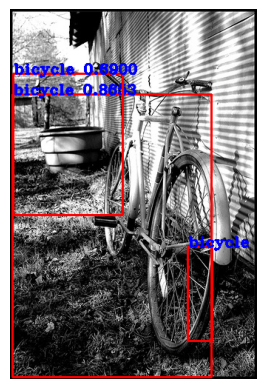

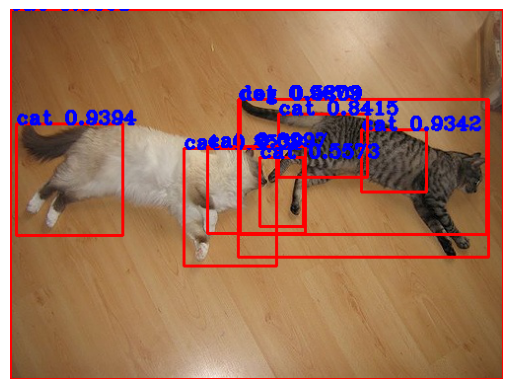

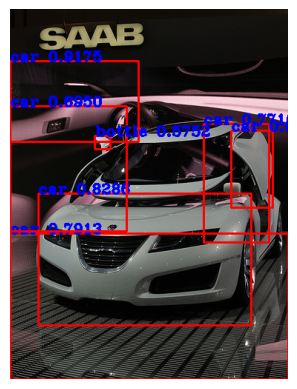

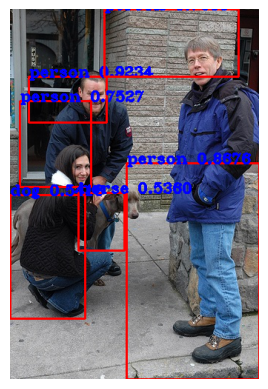

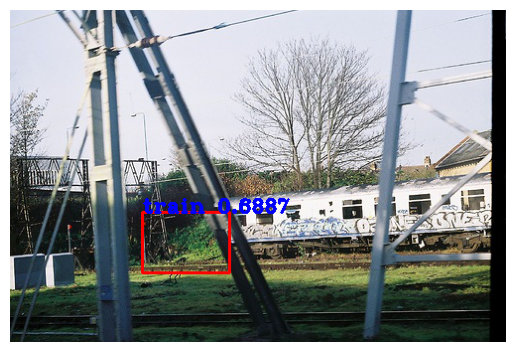

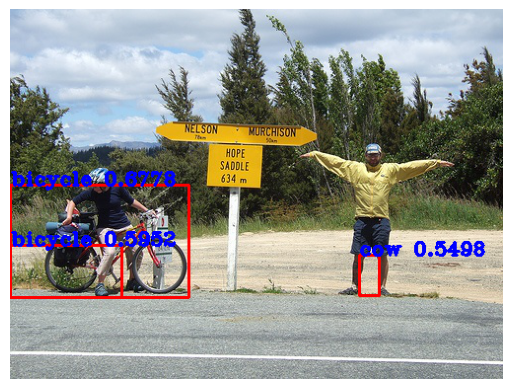

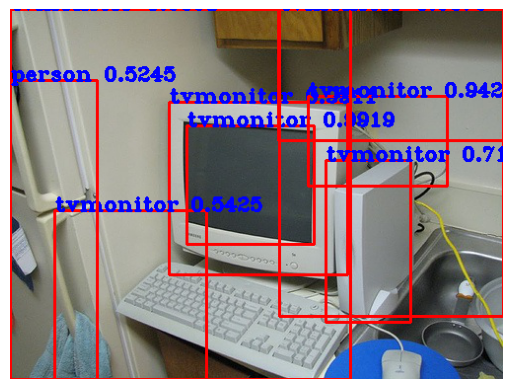

In [54]:
for i in range(10):
    image = np.array(voc_dataset_val[i][0])
    final_image = predicte(image, only_boxed_image=True,
                          label_map=idx_2_label,
                          threshold=0.5, iou_threshold=0.5)
    plt.axis("off")
    plt.imshow(final_image)
    plt.show()